In [155]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression
from scipy.ndimage import gaussian_filter1d
from pandas import DataFrame, Series
import matplotlib.pylab as plt
import seaborn as sns 
import pandas as pd
import numpy as np
import datetime
import pyproj 
import random
import os
import io

%matplotlib inline
np.set_printoptions(precision=3 , suppress= True)

In [156]:
#initial parameters - path
folder_path = '/home/rafaela/internship/time_series/TimeSeries-insar/egm_files'
file_path = os.path.join(folder_path, 'EGMS_L3_E44N25_100km_U.csv')
teste = pd.read_csv(file_path)

teste_reduced = teste.iloc[:,list(range(1, 4)) + list(range(11, 375))]
print(teste_reduced)

        easting  northing  height  20160105  20160111  20160117  20160123  \
0       4499150   2596450  2186.4       3.2       5.2       3.7       1.6   
1       4499350   2596550  2060.1       4.3       2.8       2.5       2.9   
2       4499150   2596550  2112.4      -2.2      -2.0      -1.5      -2.1   
3       4498950   2596550  2075.7      -1.2      -1.7      -1.4      -0.9   
4       4498850   2596550  2024.0       1.4       1.7      -1.9      -2.3   
...         ...       ...     ...       ...       ...       ...       ...   
209839  4415850   2516650   565.8      -1.0      -0.2       0.0       0.8   
209840  4415950   2516650   563.0       1.0       0.5       0.5       0.9   
209841  4416050   2516650   551.3       0.8       1.4       1.2      -0.2   
209842  4416150   2516650   537.0      -1.5      -3.2      -3.1       1.0   
209843  4416250   2516750   535.2      -3.2      -1.8      -1.2       0.1   

        20160129  20160204  20160210  ...  20211029  20211104  20211110  \


In [157]:
#define the ETRS89-LAEA and the UTM projection
etrs89_laea = pyproj.CRS("EPSG:3035")
wgs84 = pyproj.CRS("EPSG:4326")
utm_32 = pyproj.CRS("EPSG:23032")

In [59]:
teste_new = teste_reduced.copy()

transformer = pyproj.Transformer.from_crs(etrs89_laea, wgs84)
teste_new["latitude"], teste_new["longitude"] = transformer.transform(teste_new["northing"].to_numpy(), teste_new["easting"].to_numpy())

print(teste_new)

        easting  northing  height  20160105  20160111  20160117  20160123  \
0       4499150   2596450  2186.4       3.2       5.2       3.7       1.6   
1       4499350   2596550  2060.1       4.3       2.8       2.5       2.9   
2       4499150   2596550  2112.4      -2.2      -2.0      -1.5      -2.1   
3       4498950   2596550  2075.7      -1.2      -1.7      -1.4      -0.9   
4       4498850   2596550  2024.0       1.4       1.7      -1.9      -2.3   
...         ...       ...     ...       ...       ...       ...       ...   
209839  4415850   2516650   565.8      -1.0      -0.2       0.0       0.8   
209840  4415950   2516650   563.0       1.0       0.5       0.5       0.9   
209841  4416050   2516650   551.3       0.8       1.4       1.2      -0.2   
209842  4416150   2516650   537.0      -1.5      -3.2      -3.1       1.0   
209843  4416250   2516750   535.2      -3.2      -1.8      -1.2       0.1   

        20160129  20160204  20160210  ...  20211110  20211116  20211122  \


In [158]:
latitude_min = 45.700
latitude_max = 46.900
longitude_min = 12.100
longitude_max = 12.300

teste_area_selected = teste_new[((teste_new['latitude'] > latitude_min) & (teste_new['latitude'] < latitude_max) &
                  (teste_new['longitude'] > longitude_min) & (teste_new['longitude'] < longitude_max))]

print(teste_area_selected)

       easting  northing  height  20160105  20160111  20160117  20160123  \
259    4498350   2575750   525.1       0.7       0.8       0.4       0.6   
261    4498350   2575850   528.4       1.2       1.3       1.4       1.7   
262    4498450   2575850   501.7       0.5       0.1       0.1       0.1   
266    4498350   2575950   514.3       0.8       0.4       0.6       0.8   
268    4498450   2575950   494.6       0.9       1.3       0.6       0.2   
...        ...       ...     ...       ...       ...       ...       ...   
73304  4484050   2578950  1685.6       0.5       0.2      -0.1      -0.2   
73305  4483150   2578950  1570.4      -1.4      -1.2      -0.7      -0.6   
73306  4484250   2578950  1716.6       0.3      -0.3       0.0       0.5   
73307  4484150   2578950  1697.4       2.7       1.9       1.5       0.8   
73308  4483250   2578950  1587.8      -0.8      -0.8      -0.1      -0.1   

       20160129  20160204  20160210  ...  20211110  20211116  20211122  \
259         0

In [191]:
def selec_points(teste_area_selected, indice_number):
    points_location = teste_area_selected.iloc[indice_number, 367:369]
    teste_point = teste_area_selected.iloc[indice_number, 3:367]
    teste_point.index = pd.to_datetime(teste_point.index, format='%Y%m%d')
    points_dataframe = pd.DataFrame(teste_point, columns=[teste_point.name])
    return (points_dataframe, points_location)
    
num_points = 100
indicies = random.choices(range(len(teste_area_selected)), k = num_points)
points_dictionaire = {}
points_location_list = []

for indice_number in indicies:
    points_dataframe, points_location = selec_points(teste_area_selected, indice_number)
    points_dictionaire[indice_number] = points_dataframe
    points_location_list.append(points_location)

In [192]:
def linear_detrend(column_name, indice_data):
 
    #getting the linear model to substract from the original time series:    
    x = np.arange(len(indice_data)).reshape(-1, 1)
    y = indice_data.values.reshape(-1, 1)
    
    linear_model = LinearRegression().fit(x, y)
    regression_line = linear_model.predict(x)
    
    detrended_values = y.flatten() - regression_line.flatten()
    #detrended_values = station_data[f'{station_name}_east(m)'].values - regression_line.flatten()
    
    detrended_dataframe = pd.DataFrame(
        detrended_values, 
        index=indice_data.index, 
        columns=[f'{column_name}_up(mm)_detrended'])
        
    return detrended_dataframe


#dictionaries to store the data
detrended_data_dict = {}

#calling the function
for indice_number, indice_data in points_dictionaire.items():
    
    column_name = indice_data.columns[0]
    detrended_dataframe = linear_detrend(
        column_name, 
        indice_data)
    detrended_data_dict[column_name] = detrended_dataframe
    

#printing dataframe
#stations detrended
#for indice_number, indice_data in detrended_data_dict.items():
    #print(f'{indice_number}: \n{indice_data}\n')

In [193]:
def remove_outliers(indice_number, indice_data):
    limiar_z = 3.0
    
    
    selecting_outliers = indice_data[(np.abs(indice_data-indice_data.mean()) 
                                              < limiar_z*indice_data.std())]
    
    
    outliers_removed_dataframe = pd.DataFrame(selecting_outliers, 
                                              index=indice_data.index)
    
    outliers_removed_dataframe = outliers_removed_dataframe.rename(
        columns={f'{indice_number}_up(mm)_detrended':f'{indice_number}_up(mm)'})  
    
    outliers_removed_dataframe.dropna(inplace=True)
    
    return outliers_removed_dataframe

#dictionaries to store the data
area_outliers_removed_dict = {}

#calling the function
for indice_number, indice_data in detrended_data_dict.items():
    outliers_removed_dataframe = remove_outliers(
        indice_number, 
        indice_data)
    area_outliers_removed_dict[indice_number] = outliers_removed_dataframe

#printing dataframe
#stations detrended
#for indice_number, indice_data in area_outliers_removed_dict.items():
    #print(f'{indice_number}: \n{indice_data}\n')

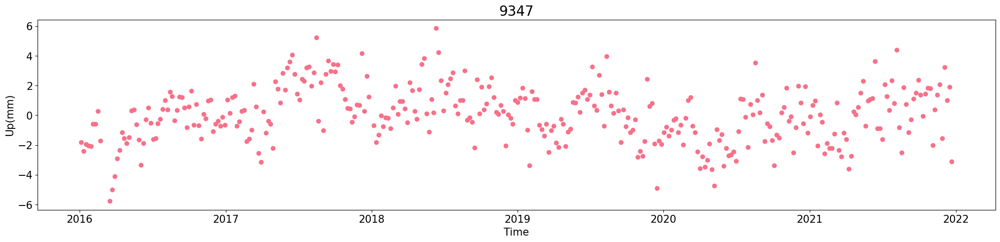

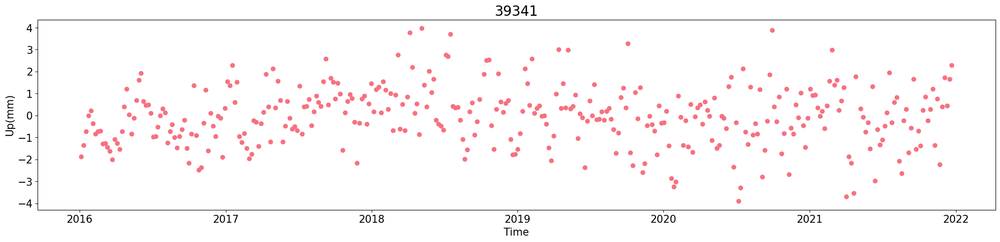

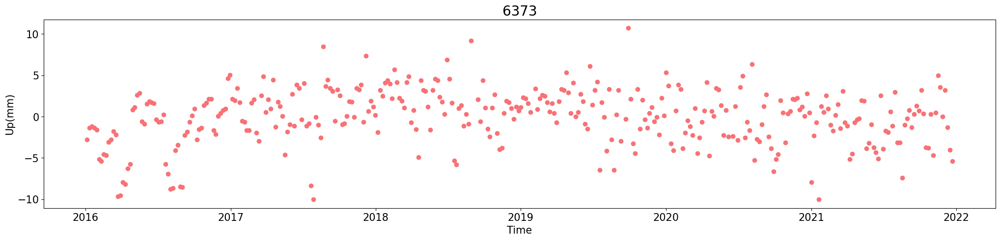

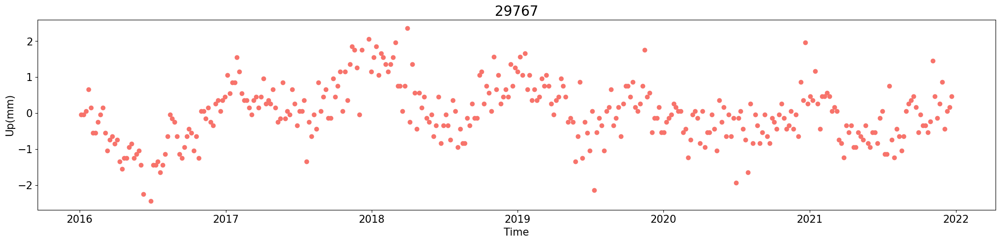

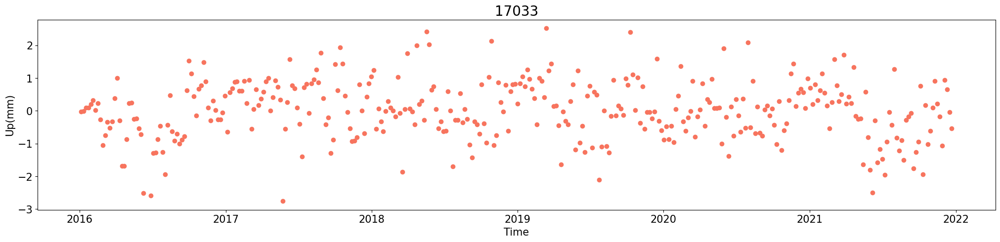

...

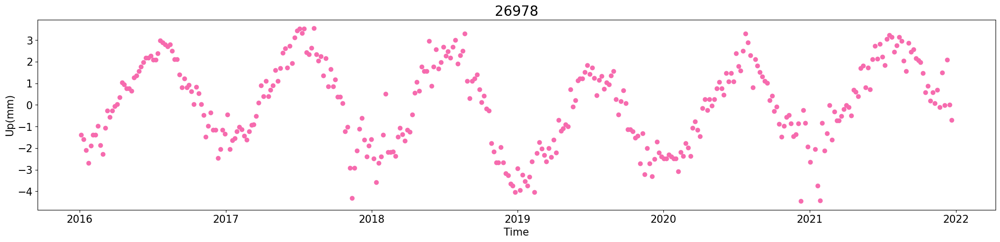

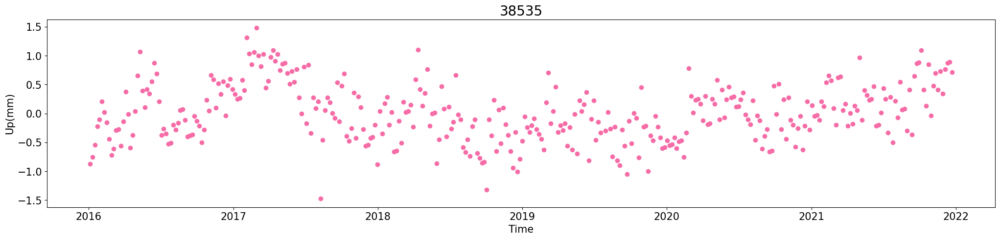

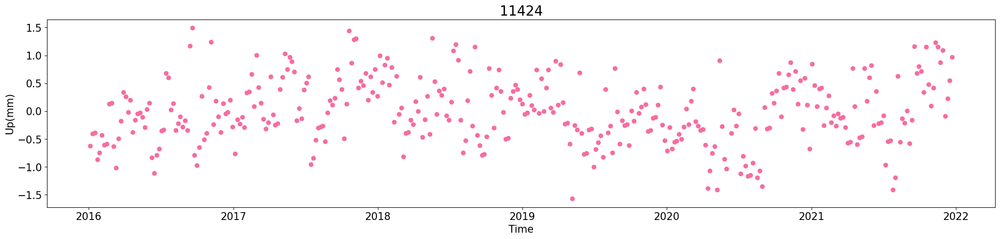

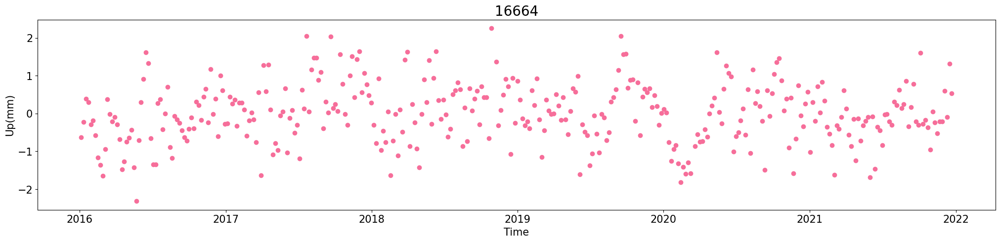

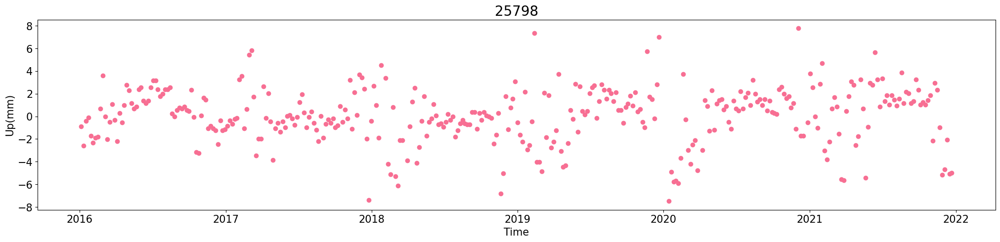

In [194]:
#checking the areas's plots - brse detrended

colors = sns.color_palette("husl", len(area_outliers_removed_dict))
#folder = ''

for i, (indice_number, indice_data) in enumerate(area_outliers_removed_dict.items()):
    plt.figure(figsize=(25, 5))
    
    plt.plot(indice_data.index, indice_data, 'o', color = colors[i])
    plt.title(f'{indice_number}', fontsize = 20)
    plt.xlabel('Time', fontsize = 15)
    plt.xticks(fontsize=15)
    plt.ylabel('Up(mm)', fontsize = 15)
    plt.yticks(fontsize=15)
    #plt.ylim(-0.008,0.008)
   
    #fl = os.path.join(folder, f'{indice_number}.svg')
    #f = io.BytesIO()
    #plt.savefig(fl, format="svg")

    plt.show()

In [195]:
def get_rolling_mean(indice_number, indice_data):
    
    area_rolling_mean = indice_data.rolling(2, min_periods=1).mean()
    
    areas_rolling_mean_dataframe = pd.DataFrame(area_rolling_mean, 
                                              index=indice_data.index)
    
    areas_rolling_mean_dataframe = areas_rolling_mean_dataframe.rename(
        columns={f'{indice_number}_up(mm)':f'{indice_number}_up(mm)_rm'})
    
    areas_rolling_mean_dataframe.dropna(inplace=True)
    
    return areas_rolling_mean_dataframe

#dictionaries to store the data
areas_rolling_mean_dict = {}

#calling the function
for indice_number, indice_data in area_outliers_removed_dict.items():
    areas_rolling_mean_dataframe = get_rolling_mean(indice_number, indice_data)
    areas_rolling_mean_dict[indice_number] = areas_rolling_mean_dataframe

#printing dataframe
#stations detrended
#for indice_number, indice_data in areas_rolling_mean_dict.items():
    #print(f'{indice_number}: \n{indice_data}\n')

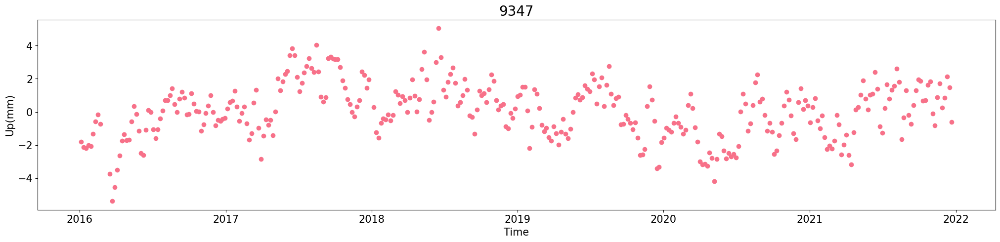

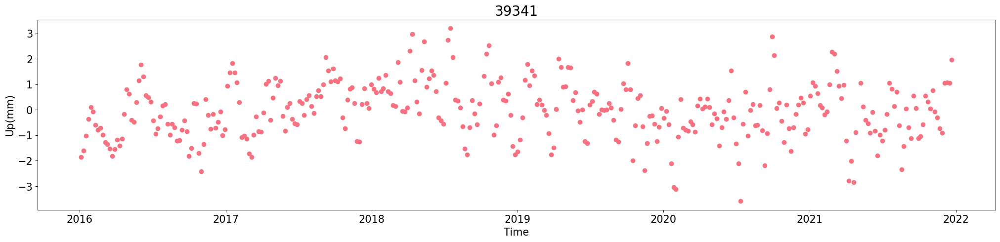

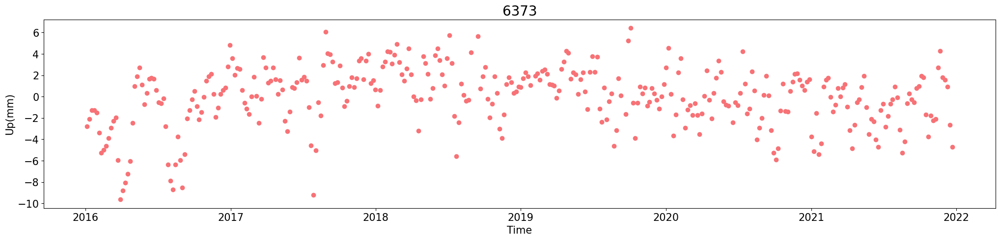

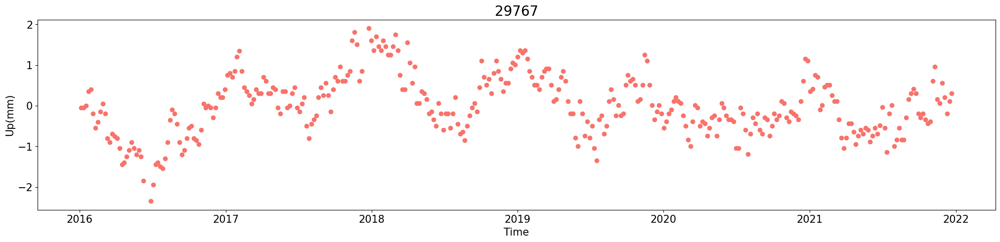

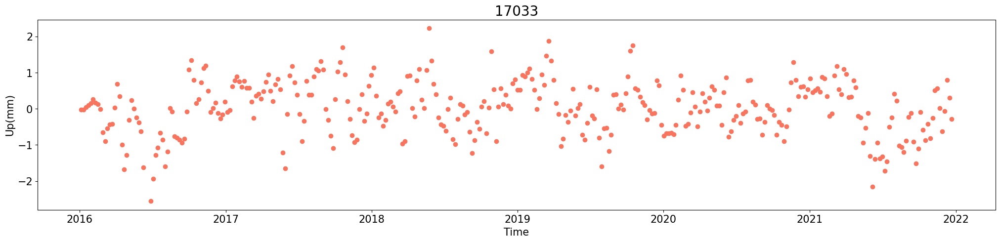

...

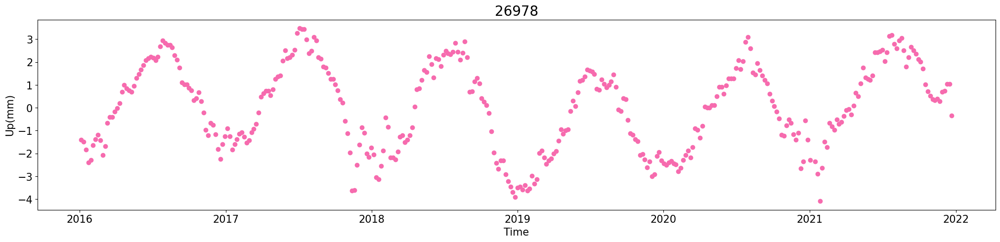

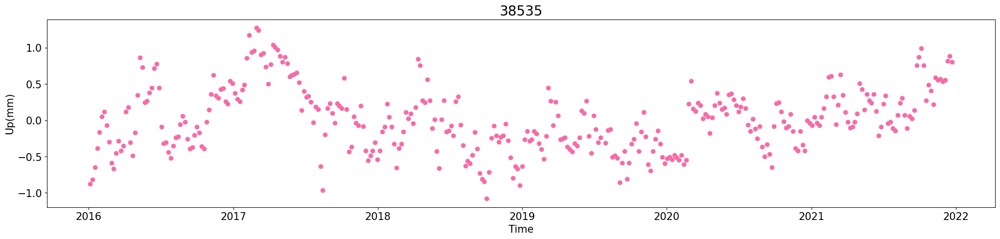

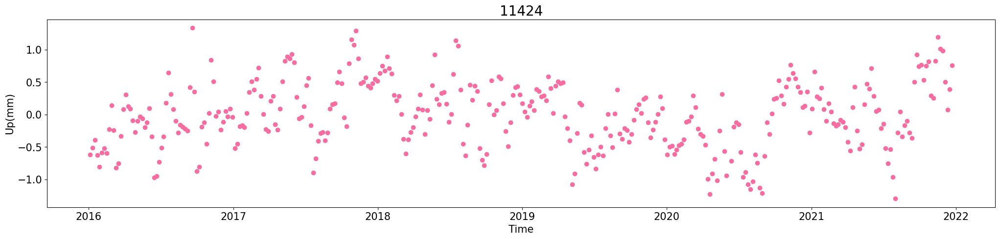

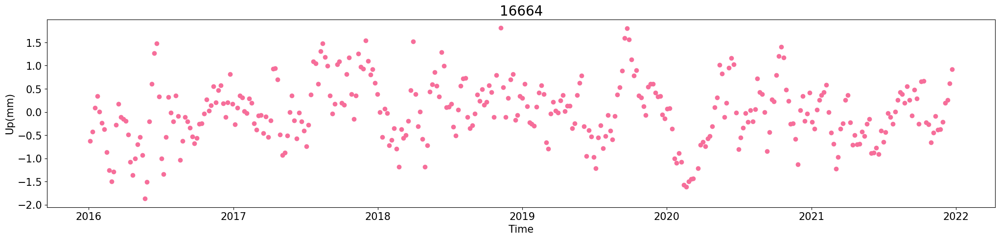

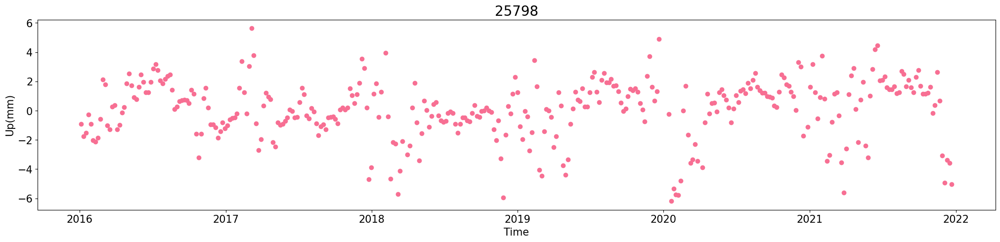

In [196]:
#checking the areas's plots - rolling mean

colors = sns.color_palette("husl", len(areas_rolling_mean_dict))
folder = '/home/rafaela/internship/time_series/TimeSeries-insar/egm_files/insar_ts_plots/points_rolling_mean/up'

for i, (indice_number, indice_data) in enumerate(areas_rolling_mean_dict.items()):
    plt.figure(figsize=(25, 5))
    
    plt.plot(indice_data.index, indice_data, 'o', color = colors[i])
    plt.title(f'{indice_number}', fontsize = 20)
    plt.xlabel('Time', fontsize = 15)
    plt.xticks(fontsize=15)
    plt.ylabel('Up(mm)', fontsize = 15)
    plt.yticks(fontsize=15)
    #plt.ylim(-0.008,0.008)
   
    fl = os.path.join(folder, f'{indice_number}.svg')
    f = io.BytesIO()
    plt.savefig(fl, format="svg")

    plt.show()

In [85]:
#checking all point together:

#colors = sns.color_palette("husl", len(areas_rolling_mean_dict))
#folder = ''

#plt.figure(figsize=(35, 15))

#for i, (indice_number, indice_data) in enumerate(areas_rolling_mean_dict.items()):
    #plt.plot(indice_data.index, indice_data, label = f'{indice_number}', color=colors[i], lw=1.5)

#plt.title('Rolling Mean - All Points', fontsize=30)
#plt.xlabel('Time', fontsize=20)
#plt.xticks(fontsize=20)
#plt.ylabel('Up(mm)', fontsize=20)
#plt.yticks(fontsize=20)
#plt.xlim(pd.Timestamp('2011-01-15'), pd.Timestamp('2018-10-15'))
#plt.legend()

#fl = os.path.join(folder, 'rm_all_points_EAST.svg')
#plt.savefig(fl, format="svg")

#plt.show()

In [197]:
#getting the average for all points rolling mean
all_rm_data = pd.DataFrame()

for indice_number, indice_data in areas_rolling_mean_dict.items():
    all_rm_data[indice_number] = indice_data.squeeze()
    
avg_rm = all_rm_data.mean(axis=1).rolling(2, min_periods=1).mean()
print(avg_rm)

2016-01-05   -0.954088
2016-01-11   -0.940395
2016-01-17   -1.012039
2016-01-23   -1.024612
2016-01-29   -0.901270
                ...   
2021-11-28    0.075101
2021-12-04    0.042193
2021-12-10    0.075414
2021-12-16    0.071919
2021-12-22    0.086576
Length: 360, dtype: float64


In [198]:
#removing the average rolling mean from each point
points_avgrm_reduced = pd.DataFrame()

for indice_number, indice_data in areas_rolling_mean_dict.items():
    points_avgrm_reduced[indice_number] = indice_data[f'{indice_number}_up(mm)_rm'] - avg_rm
    
points_avgrm_reduced = points_avgrm_reduced.dropna(axis=0)

print(points_avgrm_reduced)

               9347      39341     6373      29767     17033     38212  \
2016-01-17 -1.170293 -0.019933 -0.273402  1.012732  1.050914  3.519528   
2016-01-23 -0.971491  0.662585 -0.260353  1.375322  1.121441  4.348981   
2016-01-29 -1.158603  1.009189 -0.583219  1.301998  1.056053  3.992519   
2016-03-17 -2.851275 -0.634411 -1.082574 -0.001027  0.466520  2.424393   
2016-03-23 -4.630030 -1.058795 -5.176427  0.054661  0.330145  1.946944   
...              ...       ...       ...       ...       ...       ...   
2021-09-29  1.615726 -1.434480  0.656157 -0.516871 -1.424712  0.191187   
2021-10-17  0.395431  0.246373 -1.971398 -0.645802 -1.179833  1.112844   
2021-10-23  1.305028 -0.010315 -4.097555 -0.772418 -0.748512  1.503090   
2021-11-16  0.573294 -0.607184  2.427698 -0.149000  0.256652  2.993958   
2021-11-22  1.510466 -0.936296  4.079116 -0.148041 -0.184452  3.361780   

               7741      72293     71795     30367  ...     32560     4328   \
2016-01-17  0.635145  0.004755 -

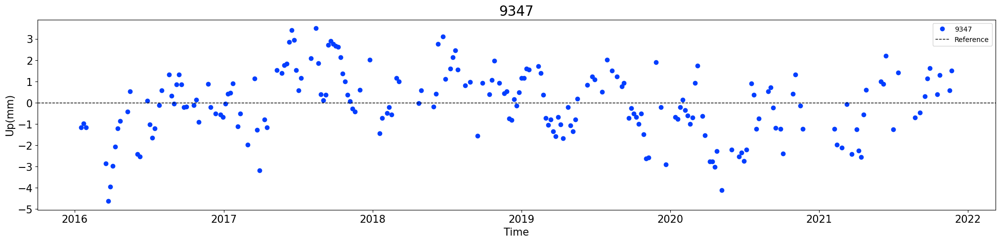

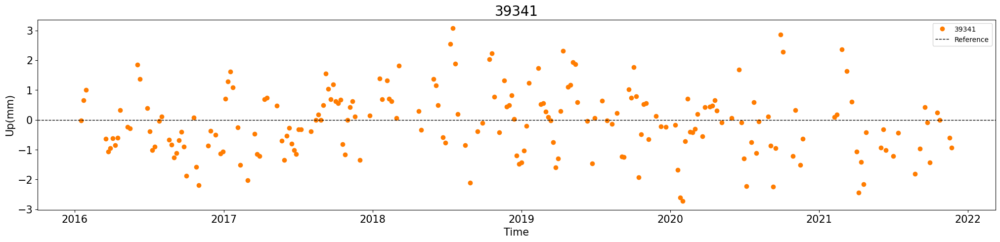

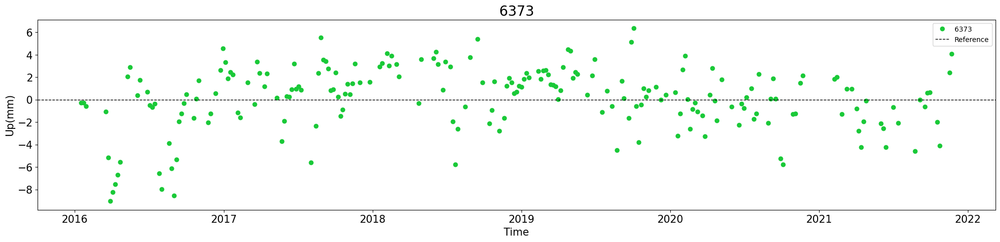

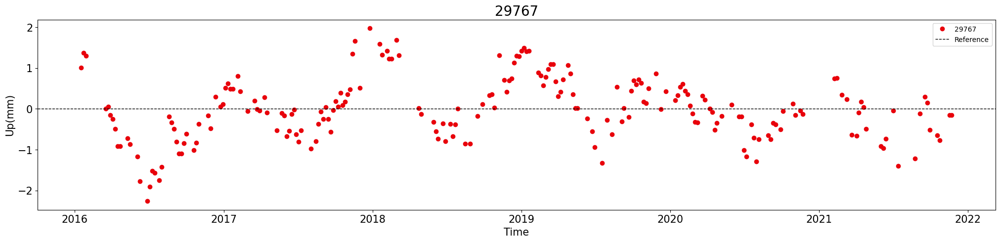

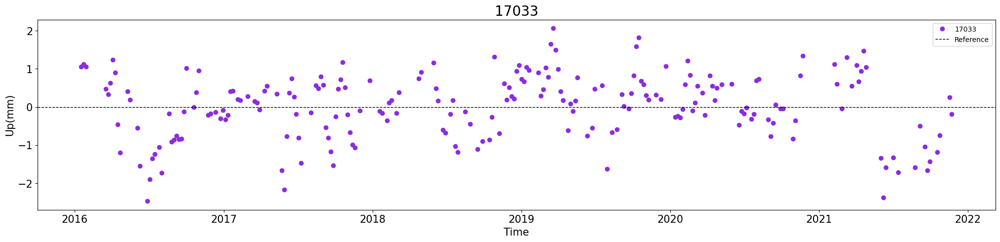

...

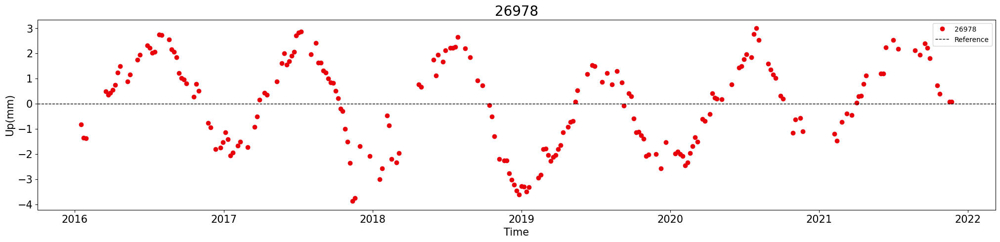

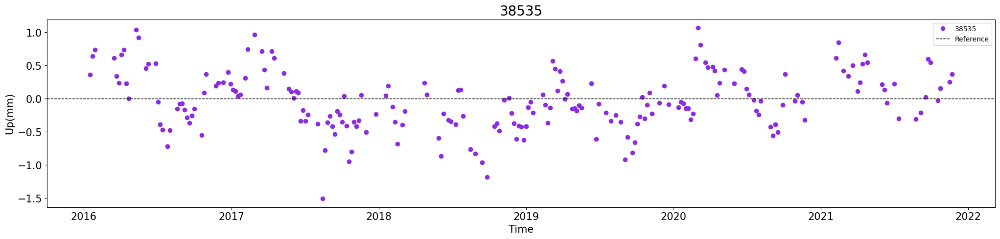

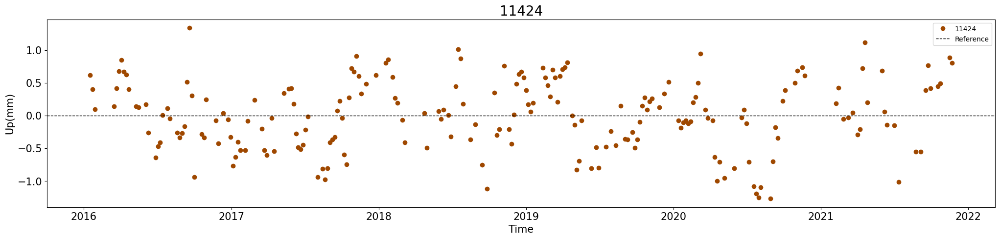

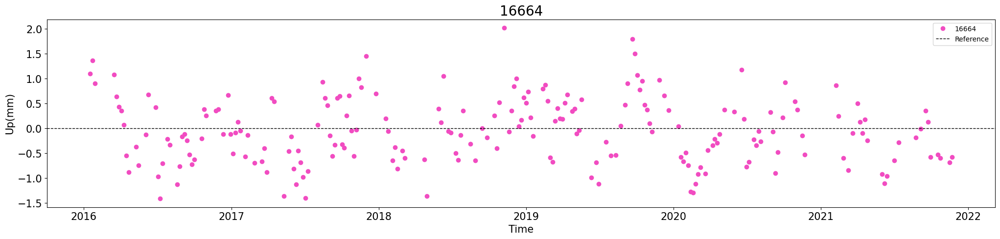

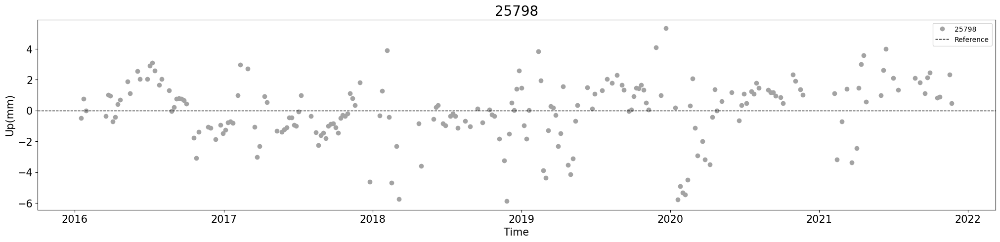

In [199]:
#checking the points plots - AFTER the reduction

colors = sns.color_palette("bright", len(points_avgrm_reduced))
folder = '/home/rafaela/internship/time_series/TimeSeries-insar/egm_files/insar_ts_plots/points_after_avg_rolling_mean/up'

for i, (column, color) in enumerate(zip(points_avgrm_reduced.columns, colors)):
    plt.figure(figsize=(25, 5))
    plt.plot(points_avgrm_reduced.index, points_avgrm_reduced[column], 'o', color=color, lw=2, label=column) 
    
    plt.title(f'{column}', fontsize = 20)
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1, label='Reference')
    plt.xlabel('Time', fontsize = 15)
    plt.xticks(fontsize = 15)
    plt.ylabel('Up(mm)', fontsize = 15)                                       
    plt.yticks(fontsize = 15)
    #plt.ylim(-0.008,0.008)
    #plt.xlim(pd.Timestamp('2011-01-15'), pd.Timestamp('2018-07-15'))

    plt.legend()
    
    fl = os.path.join(folder, f'{column}.svg')
    f = io.BytesIO()
    plt.savefig(fl, format="svg")
    
    plt.show()

In [200]:
points_location_df = pd.DataFrame(points_location_list)
points_file_path = "/home/rafaela/internship/time_series/TimeSeries-insar/egm_files/points_location_list_up.csv"
points_location_df.to_csv(points_file_path, index=True)